# 1. Attention

## 1.1 seq2seq

**一个序列到序列（seq2seq）模型，接收的输入是一个（单词、字母、图像特征）序列，输出是另外一个序列**

有2篇开创性的论文都对这些模型进行了解释：

Sutskever等2014年发表的https://papers.nips.cc/paper/5346-sequence-to-sequence-learning-with-neural-networks.pdf

和Cho等2014年发表的http://emnlp2014.org/papers/pdf/EMNLP2014179.pdf

### 1.1.1 seq2seq 结构

seq2seq模型是由编码器（Encoder）和解码器（Decoder）组成的。其中，编码器会处理输入序列中的每个元素，把这些信息转换为一个向量（称为上下文（context））。当我们处理完整个输入序列后，编码器把上下文（context）发送给解码器，解码器开始逐项生成输出序列中的元素。

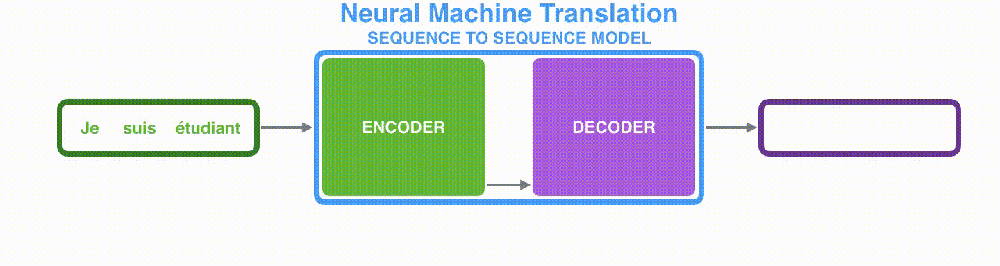

在**机器翻译**任务中，上下文（context）是一个向量（基本上是一个数字数组)。编码器和解码器在Transformer出现之前一般采用的是循环神经网络

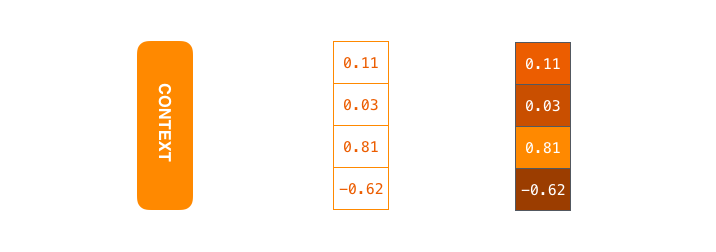

上下文context对应图里中间一个浮点数向量，在实际应用中，上下文向量的长度可能是 256，512 或者 1024。

根据设计，RNN 在每个时间步接受 2 个输入：
1. 输入序列中的一个元素（在解码器的例子中，输入是指句子中的一个单词，最终被转化成一个向量）
2. 一个 hidden state（隐藏层状态，也对应一个向量）

## 1.2 Word Embedding

我们使用一类称为 **word embedding** 的方法把每个单词都转化为一个向量。这类方法把单词转换到一个向量空间，这种表示能够捕捉大量单词之间的语义信息

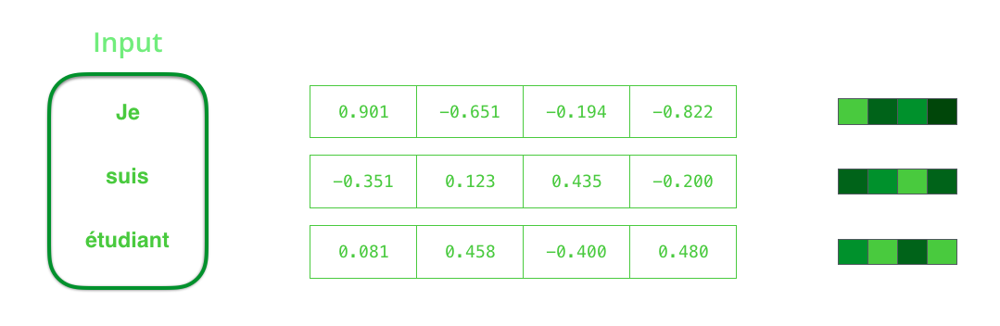

我们在处理单词之前，需要把他们转换为向量。这个转换是使用 word embedding 算法来完成的。我们可以使用预训练好的 embeddings，或者在我们的数据集上训练自己的 embedding。通常 embedding 向量大小是 200 或者 300，为了简单起见，我们这里展示的向量长度是4。上图左边每个单词对应中间一个4维的向量。

## 1.3 RNN

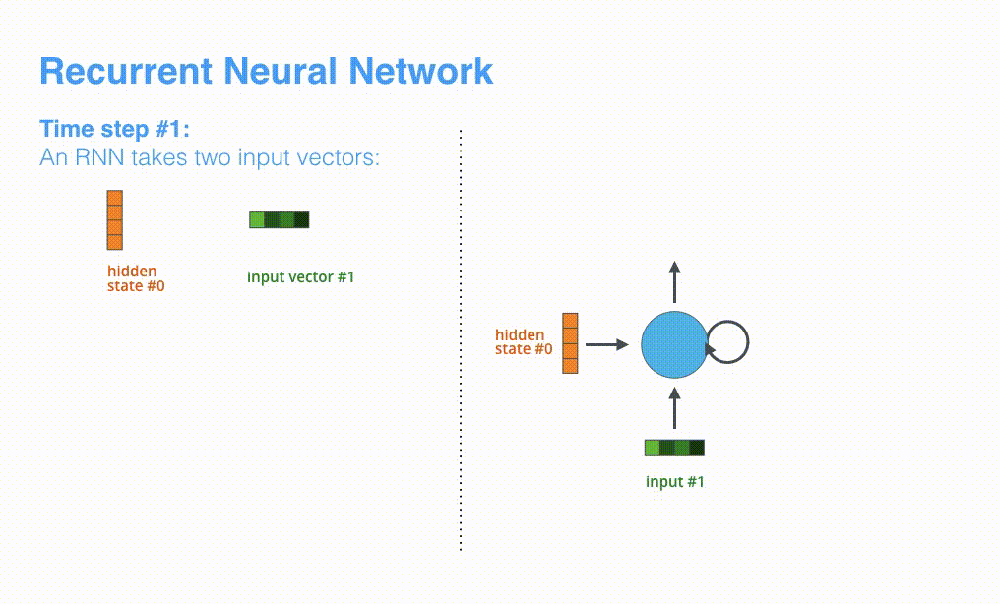

RNN 在第 2 个时间步，采用第 1 个时间步的 hidden state（隐藏层状态） 和第 2 个时间步的输入向量，来得到输出。

## 1.2 RNN Encoder-Decoder Overview

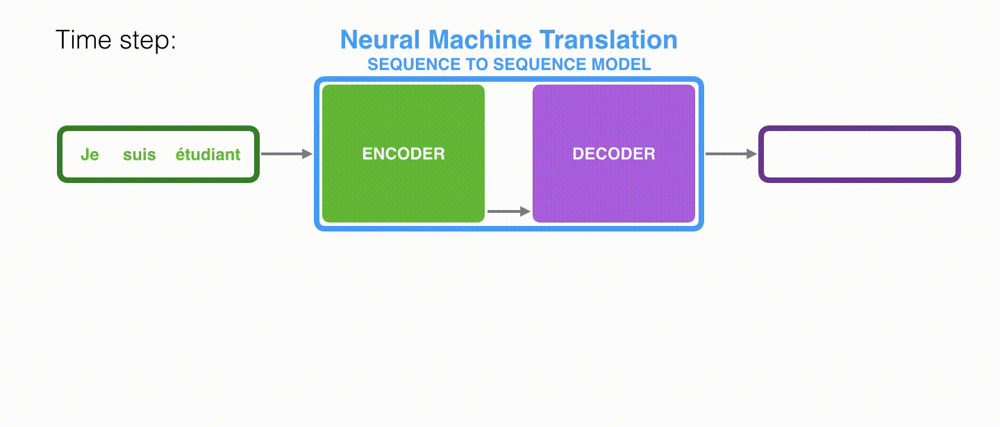

**注意**: 编码器的最后一个 hidden state（隐藏层状态）实际上是我们传给解码器的上下文（context）。

编码器和解码器在每个时间步处理输入，并得到输出。由于编码器和解码器都是 RNN，RNN 会根据当前时间步的输入，和前一个时间步的 hidden state（隐藏层状态），更新当前时间步的 hidden state（隐藏层状态）。

## 1.3 Attention Overview

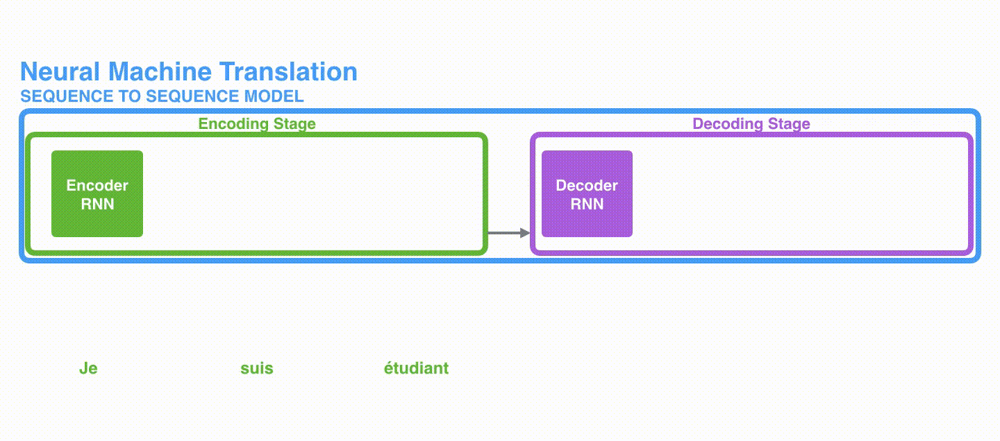

编码器会把更多的数据传递给解码器。编码器把所有时间步的 hidden state（隐藏层状态）传递给解码器，而不是只传递最后一个 hidden state（隐藏层状态）。

### 1.3.1 Attention 的详细步骤

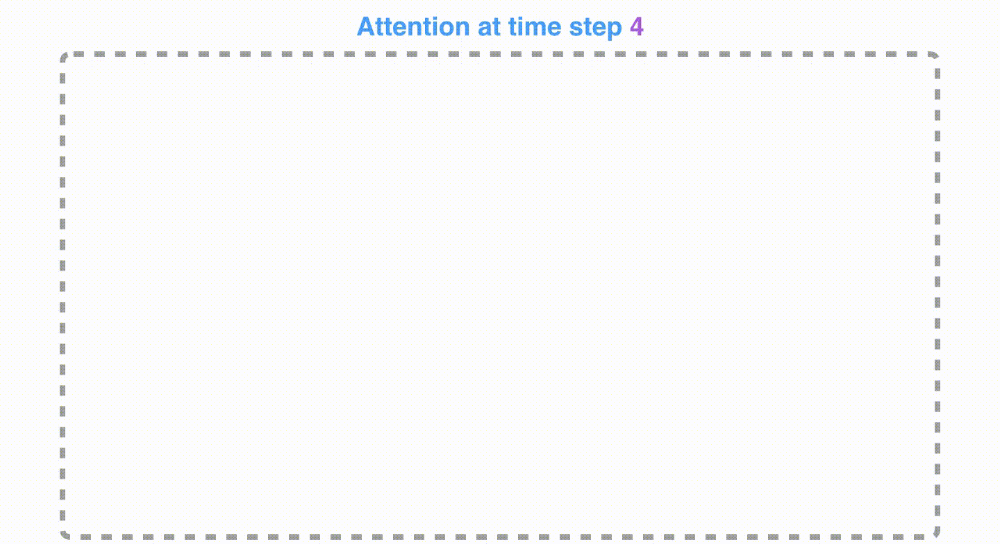

注意力模型的解码器在产生输出之前，做了一个额外的处理：

1. 查看所有接收到的编码器的 hidden state（隐藏层状态）。其中，编码器中每个 hidden state（隐藏层状态）都对应到输入句子中一个单词。
2. 给每个 hidden state（隐藏层状态）一个分数（我们先忽略这个分数的计算过程）。
3. 将每个 hidden state（隐藏层状态）乘以经过 softmax 的对应的分数，从而，高分对应的 hidden state（隐藏层状态）会被放大，而低分对应的 hidden state（隐藏层状态）会被缩小。

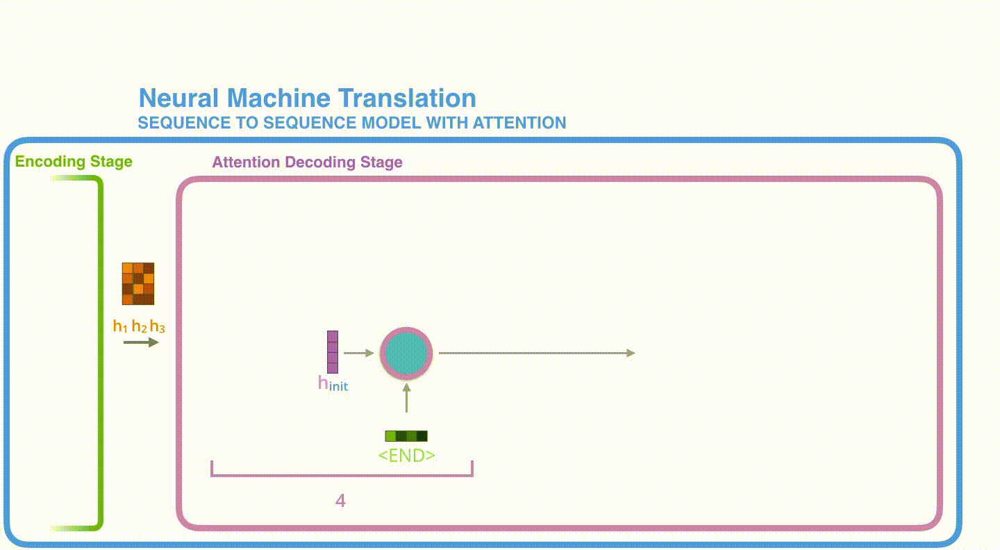

**Process:**

1. 注意力模型的解码器 RNN 的输入包括：一个embedding 向量，和一个初始化好的解码器 hidden state（隐藏层状态）。
2. RNN 处理上述的 2 个输入，产生一个输出和一个新的 hidden state（隐藏层状态 h4 向量），其中输出会被忽略。
3. 注意力的步骤：我们使用编码器的 hidden state（隐藏层状态）和 h4 向量来计算这个时间步的上下文向量（C4）。
4. 我们把 h4 和 C4 拼接起来，得到一个向量。
5. 我们把这个向量输入一个前馈神经网络（这个网络是和整个模型一起训练的）。
6. 前馈神经网络的输出的输出表示这个时间步输出的单词。
7. 在下一个时间步重复这个步骤。

### 1.3.2 Attention的效果

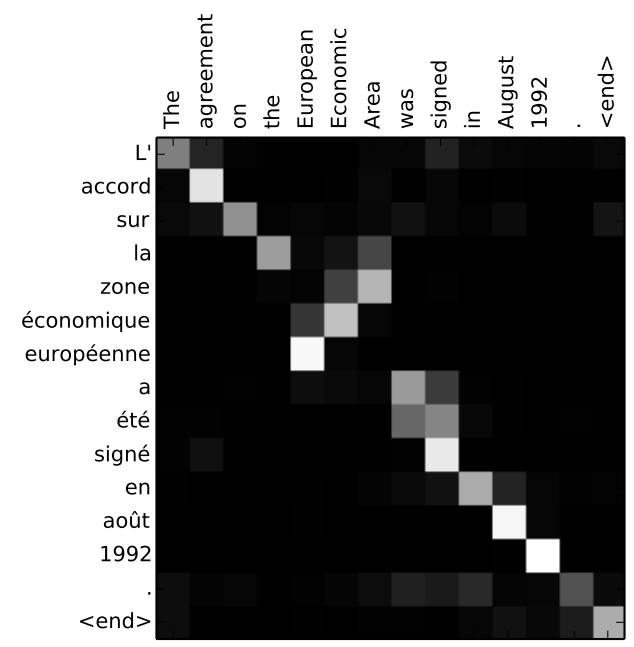

注意力模型不是无意识地把输出的第一个单词对应到输入的第一个单词。实际上，它从训练阶段学习到了如何在两种语言中对应单词的关系（在我们的例子中，是法语和英语）

**注意力机制的代码实现**： https://github.com/tensorflow/nmt

# 2. Transformer

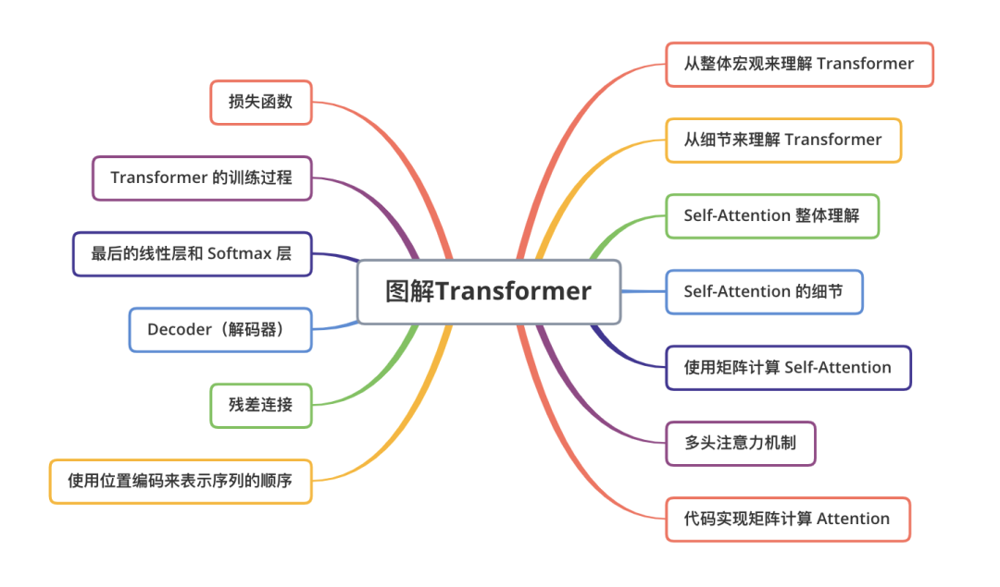

**Transformer**依赖于**Self Attention**的知识。Attention 是一种在深度学习中广泛使用的方法，Attention的思想提升了机器翻译的效果。

2017 年，Google 提出了 Transformer 模型，用 Self Attention 的结构，取代了以往 NLP 任务中的 RNN 网络结构。

这个模型的其中一个优点，就是使得模型训练过程能够并行计算。在 RNN 中，每一个 time step 的计算都依赖于上一个 time step 的输出，这就使得所有的 time step 必须串行化。

而在 Transformer 中，所有 time step 的数据，都是经过 Self Attention 计算，使得整个运算过程可以并行化计算。

**Transformer**使用了**Seq2Seq**任务中常用的结构——包括两个部分：**Encoder** 和 **Decoder**。一般的结构图，都是像下面这样：

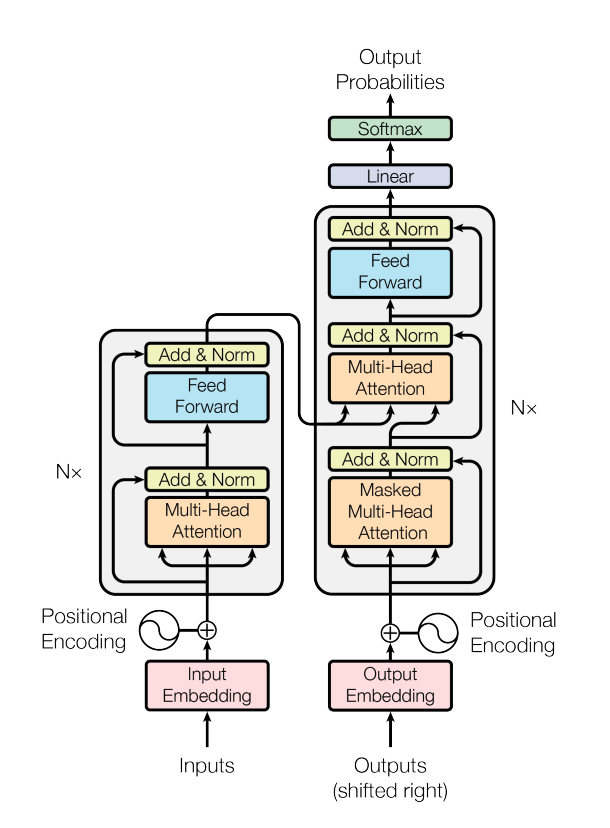

## 2.1 Transformer Overview

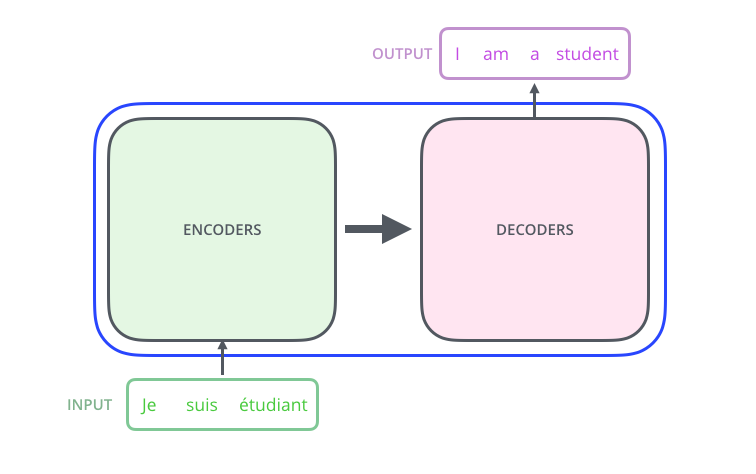

**Transformer**由两部分组成：**编码部分**(encoding component)和**解码部分**(decoding component)。 

编码部分是多层的编码器(Encoder)组成（Transformer 的论文中使用了 6 层编码器，这里的层数 6 并不是固定的，你也可以根据实验效果来修改层数）。

同理，解码部分也是由多层的解码器(Decoder)组成（论文里也使用了 6 层的解码器）。

### 2.1.1 Transformer Enocder

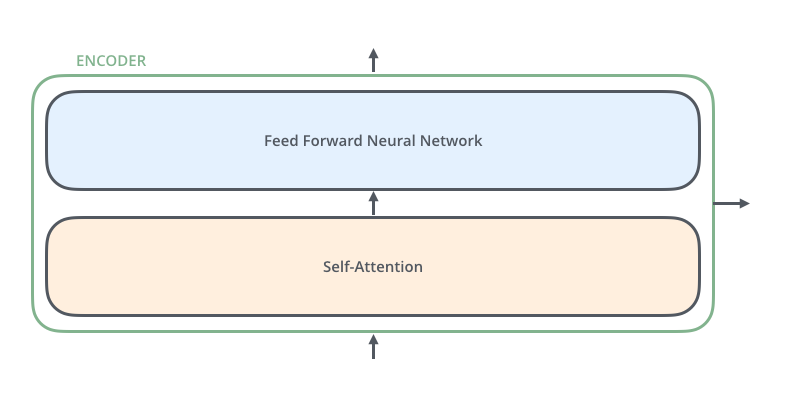

**notes**：单层的transformer encoder

输入编码器的文本数据，首先会经过一个 Self Attention 层，这个层处理一个词的时候，不仅会使用这个词本身的信息，也会使用句子中其他词的信息（你可以类比为：当我们翻译一个词的时候，不仅会只关注当前的词，也会关注这个词的上下文的其他词的信息）。

#### 2.1.1.1 Transformer Input

首先会使用**词嵌入算法**（embedding algorithm），将每个词转换为一个词向量。实际中向量一般是 256 或者 512 维。为了简化起见，这里将每个词的转换为一个 4 维的词向量。

那么整个输入的句子是一个向量列表，其中有 3 个词向量。在实际中，每个句子的长度不一样，我们会取一个适当的值，作为向量列表的长度。如果一个句子达不到这个长度，那么就填充全为 0 的词向量(padding)；如果句子超出这个长度，则做截断。

#### 2.1.1.2 Encoder Overview

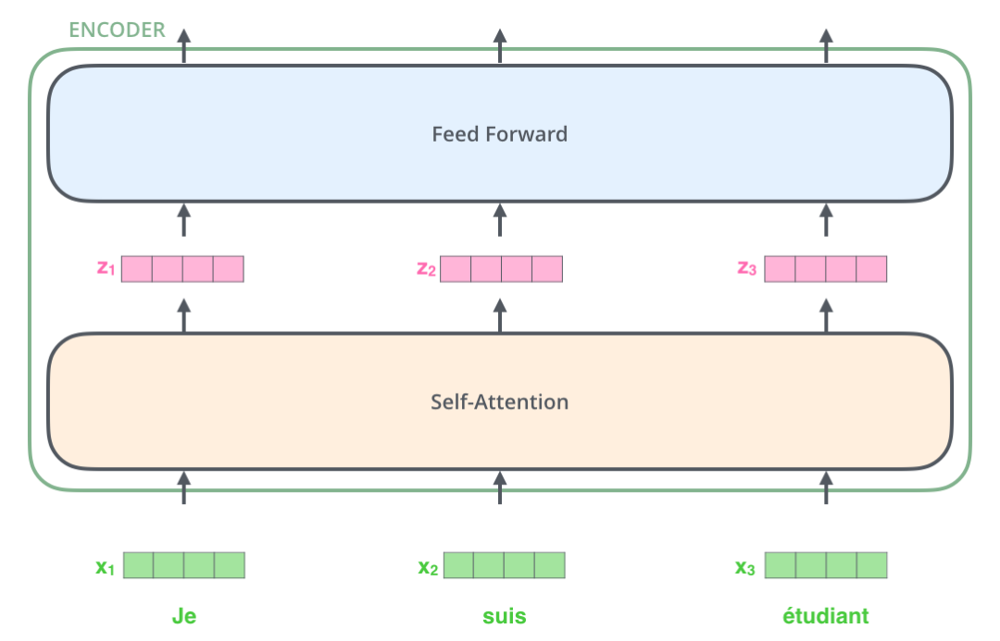

每个单词转换成一个向量之后，进入self-attention层，每个位置的单词得到新向量，然后再输入FFN神经网络

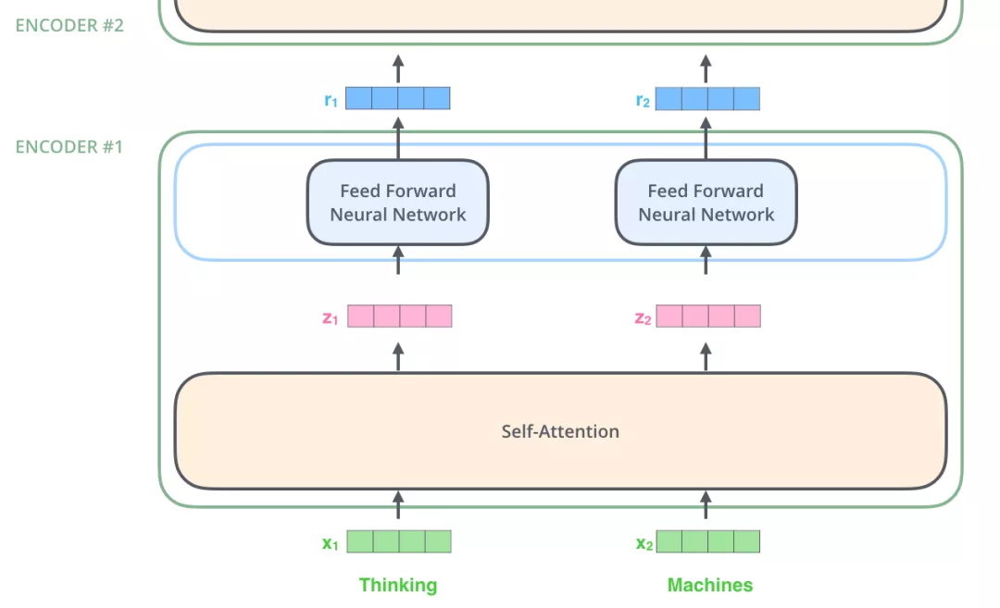

每个位置的词都经过 Self Attention 层，得到的每个输出向量都单独经过前馈神经网络层，每个向量经过的前馈神经网络都是一样的,然后再传入下一层的encoder。

### 2.1.2 Transformer Decoder

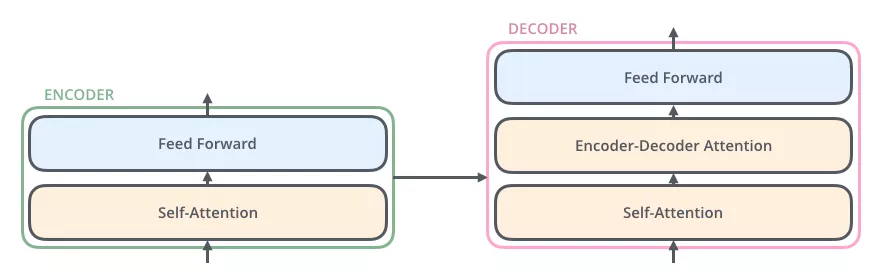

同理，解码器也具有这两层，但是这两层中间还插入了一个 Encoder-Decoder Attention 层，这个层能帮助解码器聚焦于输入句子的相关部分（类似于 seq2seq 模型 中的 Attention）

## 2.2 Self-Attention 的细节

### 2.2.1 计算Query 向量，Key 向量，Value 向量

首先我们先看下如何使用向量来计算 Self Attention，然后再看下如何使用矩阵来实现 Self Attention。（矩阵运算的方式，使得 Self Attention 的计算能够并行化，这也是 Self Attention 最终的实现方式）。

计算 Self Attention 的第 1 步是：对输入编码器的每个词向量，都创建 3 个向量，分别是：**Query** 向量，**Key** 向量，**Value** 向量。这 3 个向量是词向量分别和 3 个矩阵相乘得到的，而这个矩阵是我们要学习的参数。

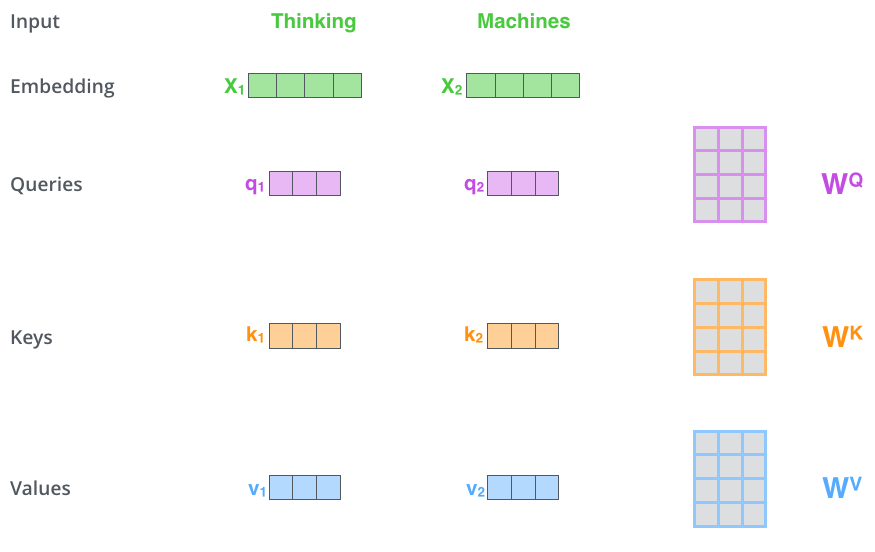

**notes**: 这 3 个新得到的向量一般比原来的词向量的长度更小。

假设这 3 个向量的长度是$d_{key}$，而原始的词向量或者最终输出的向量的长度是 512（这 3 个向量的长度，和最终输出的向量长度，是有倍数关系的）。关于 Multi-head Attention，后面会给出实际代码。这里为了简化，假设只有一个 head 的 Self-Attention。

上图中，有两个词向量：Thinking 的词向量 x1 和 Machines 的词向量 x2。以 x1 为例，X1 乘以 WQ 得到 q1，q1 就是 X1 对应的 Query 向量。同理，X1 乘以 WK 得到 k1，k1 是 X1 对应的 Key 向量；X1 乘以 WV 得到 v1，v1 是 X1 对应的 Value 向量。

### 2.2.2 计算 Attention Score （注意力分数）

假设我们现在计算第一个词 Thinking 的 Attention Score（注意力分数），需要根据 Thinking 这个词，对句子中的其他每个词都计算一个分数。这些分数决定了我们在编码Thinking这个词时，需要对句子中其他位置的每个词放置多少的注意力。

这些分数，是通过计算 "Thinking" 对应的 Query 向量和其他位置的每个词的 Key 向量的点积，而得到的。如果我们计算句子中第一个位置单词的 Attention Score（注意力分数），那么第一个分数就是 q1 和 k1 的内积，第二个分数就是 q1 和 k2 的点积。

第 3 步就是把每个分数除以 $\sqrt(d_{key})$ （$d_{key}$是 Key 向量的长度）。你也可以除以其他数，除以一个数是为了在反向传播时，求取梯度更加稳定。

第 4 步，接着把这些分数经过一个 **Softmax** 层，Softmax可以将分数归一化，这样使得分数都是正数并且加起来等于 1。

这些分数决定了在编码当前位置（这里的例子是第一个位置）的词时，对所有位置的词分别有多少的注意力。当前位置（这里的例子是第一个位置）的词会有最高的分数，但有时，关注到其他位置上相关的词也很有用。

第 5 步，得到每个位置的分数后，将每个分数分别与每个 Value 向量相乘。这种做法背后的直觉理解就是：对于分数高的位置，相乘后的值就越大，我们把更多的注意力放到了它们身上；对于分数低的位置，相乘后的值就越小，这些位置的词可能是相关性不大的，这样我们就忽略了这些位置的词。

第 6 步是把上一步得到的向量相加，就得到了 Self Attention 层在这个位置（这里的例子是第一个位置）的输出。

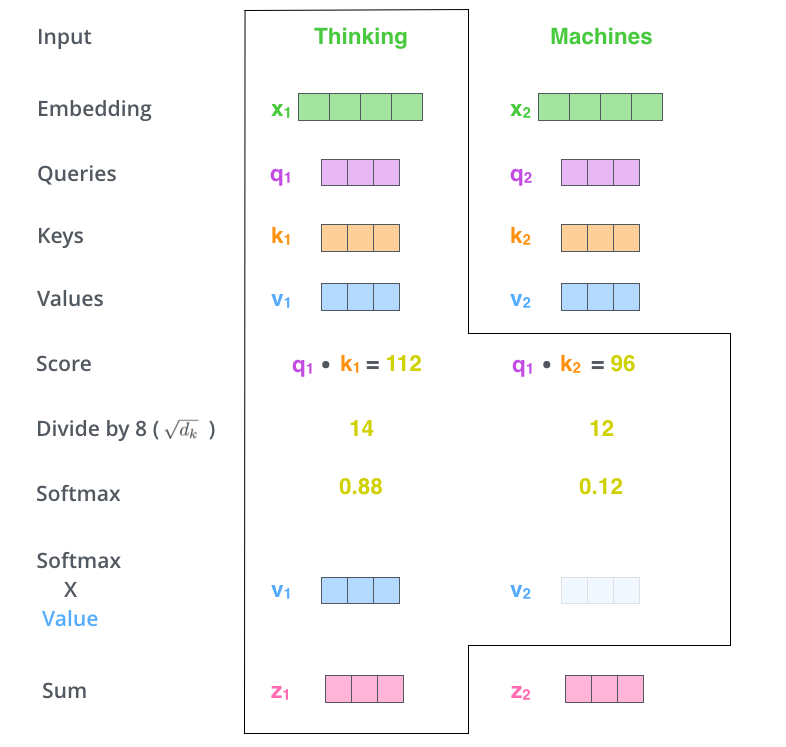

上面这张图，包含了 **Self Attention** 的全过程，最终得到的当前位置（这里的例子是第一个位置）的向量会输入到前馈神经网络。但这样每次只能计算一个位置的输出向量，在实际的代码实现中，Self Attention 的计算过程是使用矩阵来实现的，这样可以加速计算，一次就得到所有位置的输出向量。下面让我们来看，如何使用矩阵来计算所有位置的输出向量。

### 2.2.3 使用矩阵计算 Self-Attention

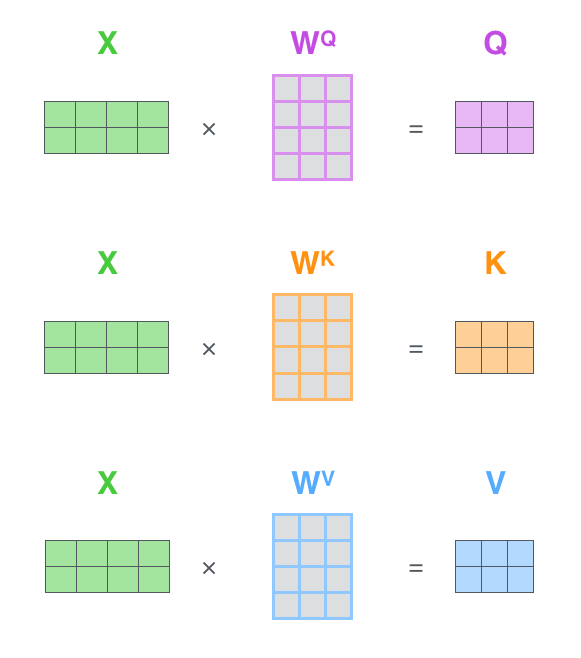

矩阵 X 中的每一行，表示句子中的每一个词的词向量，长度是 512。Q，K，V 矩阵中的每一行表示 Query 向量，Key 向量，Value 向量，向量长度是 64。

接着，由于我们使用了矩阵来计算，我们可以把上面的第 2 步到第 6 步压缩为一步，直接得到 Self Attention 的输出。

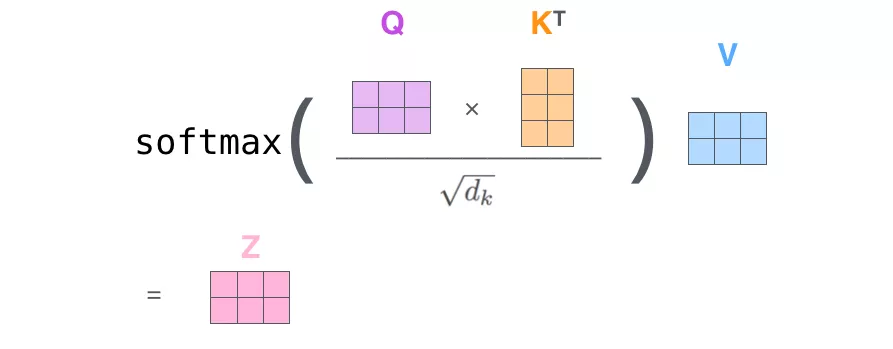

### 2.2.4 多头注意力机制（multi-head attention）

Transformer 的论文通过增加多头注意力机制（一组注意力称为一个 attention head），进一步完善了 Self Attention 层。这种机制从如下两个方面增强了 attention 层的能力：

1. 它扩展了模型关注不同位置的能力。在上面的例子中，第一个位置的输出 z1 包含了句子中其他每个位置的很小一部分信息，但 z1 可能主要是由第一个位置的信息决定的。当我们翻译句子：The animal didn’t cross the street because it was too tired时，我们想让机器知道其中的it指代的是什么。这时，多头注意力机制会有帮助。

2. 多头注意力机制赋予 attention 层多个“子表示空间”。下面我们会看到，多头注意力机制会有多组$W^Q, W^K W^V$ 的权重矩阵（在 Transformer 的论文中，使用了 8 组注意力（attention heads）。因此，接下来我也是用 8 组注意力头 （attention heads））。每一组注意力的 的权重矩阵都是随机初始化的。经过训练之后，每一组注意力$W^Q, W^K W^V$ 可以看作是把输入的向量映射到一个”子表示空间“。

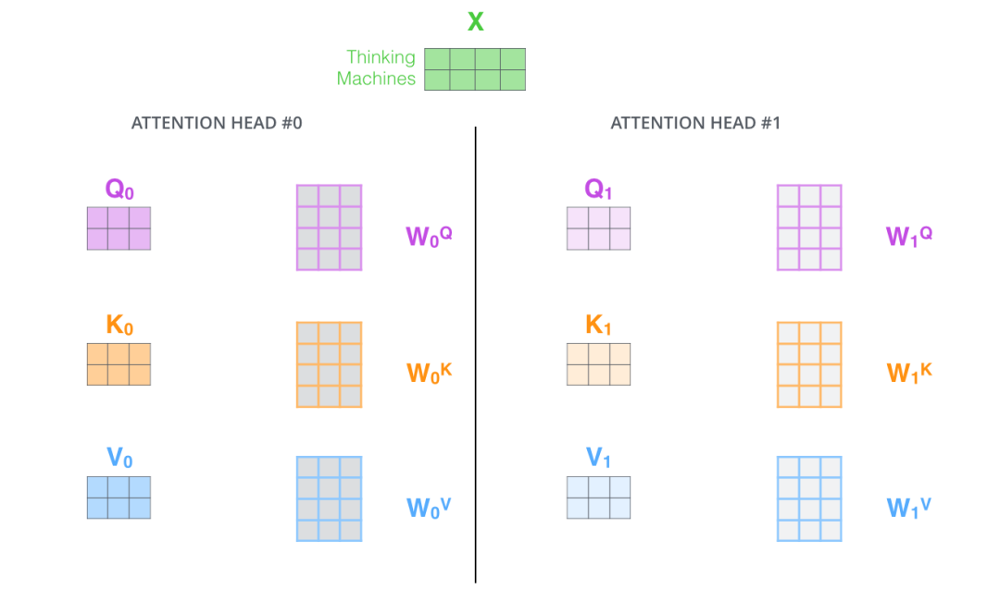

在多头注意力机制中，我们为每组注意力维护单独的 \$W^Q\$, \$W^K\$, \$W^V\$ 权重矩阵。将输入 X 和每组注意力的\$W^Q\$, \$W^K\$, \$W^V\$ 相乘，得到 8 组 Q, K, V 矩阵。

接着，我们把每组 K, Q, V 计算得到每组的 Z 矩阵，就得到 8 个 Z 矩阵。

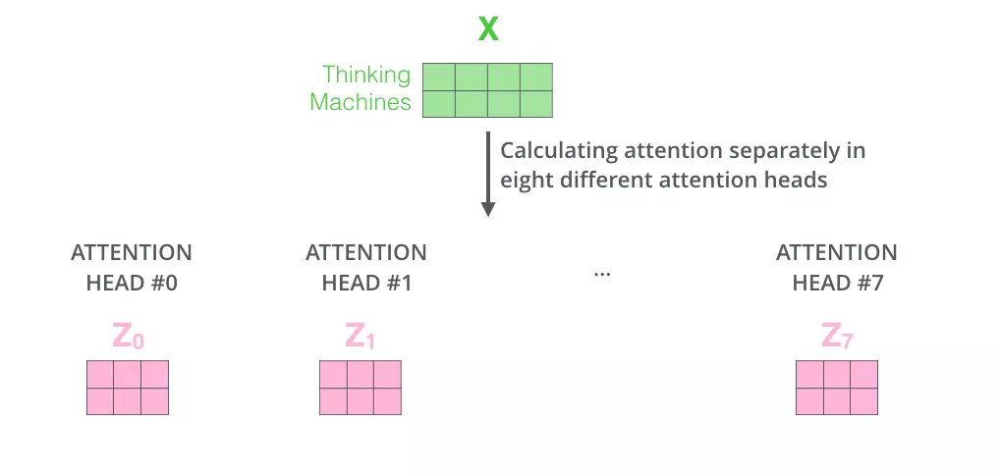

之后，我们把矩阵拼接起来，然后和另一个权重矩阵\$W^O$\相乘

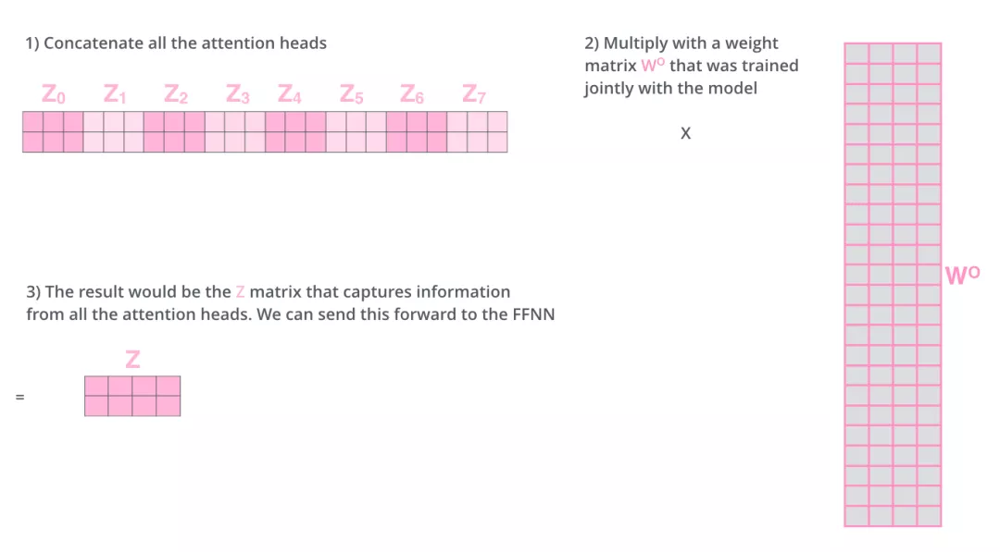

**Process**:
1. 把 8 个矩阵 {Z0,Z1...,Z7} 拼接起来
2. 把拼接后的矩阵和 WO 权重矩阵相乘
3. 得到最终的矩阵 Z，这个矩阵包含了所有 attention heads（注意力头） 的信息。这个矩阵会输入到 FFNN (Feed Forward Neural Network)层。

总结：
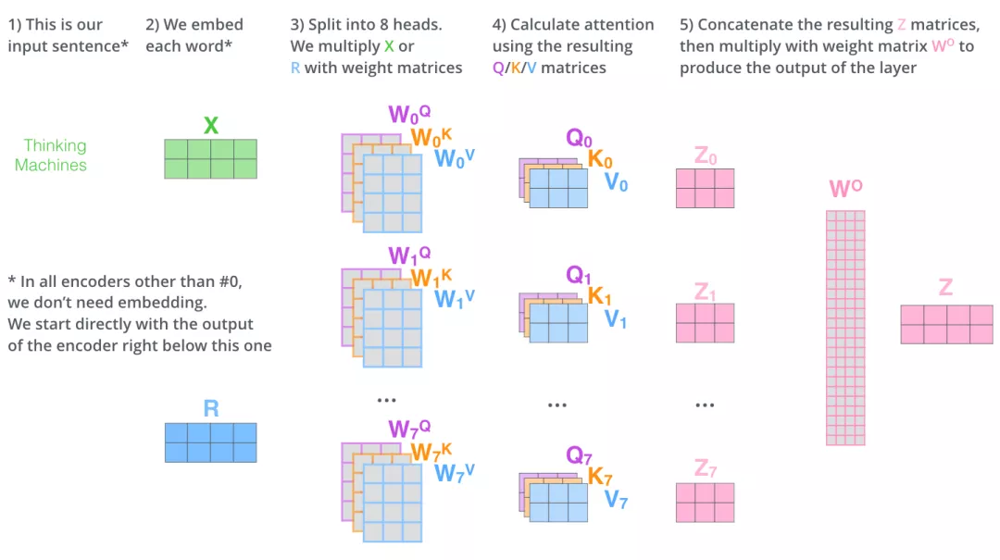

## 2.2.5 代码实现矩阵计算 Attention

PyTorch 提供了 MultiheadAttention 来实现 attention 的计算:

    torch.nn.MultiheadAttention(embed_dim, num_heads, dropout=0.0, bias=True, add_bias_kv=False, add_zero_attn=False, kdim=None, vdim=None)

参数说明如下：

\$\bullet\$ embed_dim：最终输出的 K、Q、V 矩阵的维度，这个维度需要和词向量的维度一样

\$\bullet\$ num_heads：设置多头注意力的数量。如果设置为 1，那么只使用一组注意力。如果设置为其他数值，那么 - - num_heads 的值需要能够被 embed_dim 整除

\$\bullet\$ dropout：这个 dropout 加在 attention score 后面

**notes**: 为了把词的隐向量长度平分到每一组，这样多组注意力也能够放到一个矩阵里，从而并行计算多头注意力,所以num_heads 的值需要能够被 embed_dim 整除。

例如，我们前面说到，8 组注意力可以得到 8 组 Z 矩阵，然后把这些矩阵拼接起来，得到最终的输出。如果最终输出的每个词的向量维度是 512，那么每组注意力的向量维度应该是64。如果不能够整除，那么这些向量的长度就无法平均分配。

定义 MultiheadAttention 的对象后，调用时传入的参数如下:

    forward(query, key, value, key_padding_mask=None, need_weights=True, attn_mask=None)

\$\bullet\$ query：对应于 Key 矩阵，形状是 (L,N,E) 。其中 L 是输出序列长度，N 是 batch size，E 是词向量的维度

\$\bullet\$ key：对应于 Key 矩阵，形状是 (S,N,E) 。其中 S 是输入序列长度，N 是 batch size，E 是词向量的维度

\$\bullet\$ value：对应于 Value 矩阵，形状是 (S,N,E) 。其中 S 是输入序列长度，N 是 batch size，E 是词向量的维度

\$\bullet\$ key_padding_mask：如果提供了这个参数，那么计算 attention score 时，忽略 Key 矩阵中某些 padding 元素，不参与计算 attention。形状是 (N,S)。其中 N 是 batch size，S 是输入序列长度。

    如果 key_padding_mask 是 ByteTensor，那么非 0 元素对应的位置会被忽略
    如果 key_padding_mask 是 BoolTensor，那么 True 对应的位置会被忽略
\$\bullet\$ attn_mask：计算输出时，忽略某些位置。形状可以是 2D (L,S)，或者 3D (N∗numheads,L,S)。其中 L 是输出序列长度，S 是输入序列长度，N 是 batch size。

    如果 attn_mask 是 ByteTensor，那么非 0 元素对应的位置会被忽略
    如果 attn_mask 是 BoolTensor，那么 True 对应的位置会被忽略

**notes**:需要注意的是：在前面的讲解中，我们的 K、Q、V 矩阵的序列长度都是一样的。但是在实际中，K、V 矩阵的序列长度是一样的，而 Q 矩阵的序列长度可以不一样。

这种情况发生在：在解码器部分的Encoder-Decoder Attention层中，Q 矩阵是来自解码器下层，而 K、V 矩阵则是来自编码器的输出。

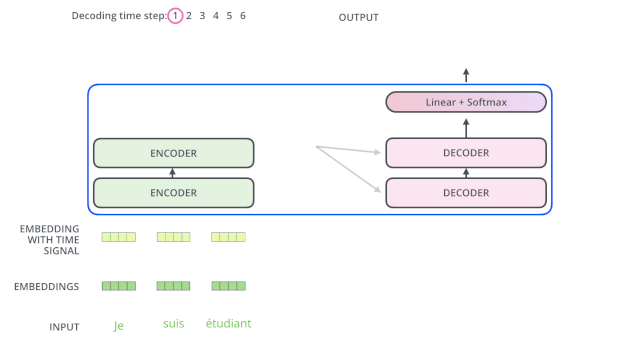

在完成了编码（encoding）阶段之后，我们开始解码（decoding）阶段。解码（decoding ）阶段的每一个时间步都输出一个翻译后的单词（这里的例子是英语翻译）。

In [ ]:
## nn.MultiheadAttention 输入第0维为length
# batch_size 为 64，有 12 个词，每个词的 Query 向量是 300 维
query = torch.rand(12,64,300)
# batch_size 为 64，有 10 个词，每个词的 Key 向量是 300 维
key = torch.rand(10,64,300)
# batch_size 为 64，有 10 个词，每个词的 Value 向量是 300 维
value= torch.rand(10,64,300)

embed_dim = 299
num_heads = 1
# 输出是 (attn_output, attn_output_weights)
multihead_attn = nn.MultiheadAttention(embed_dim, num_heads)
attn_output = multihead_attn(query, key, value)[0]
# output: torch.Size([12, 64, 300])
# batch_size 为 64，有 12 个词，每个词的向量是 300 维
print(attn_output.shape)

Output:

    attn_output：形状是 (L,N,E)
    attn_output_weights：形状是 (N,L,S) 代码示例如下：

## 2.2.6 手动计算 Attention

在 PyTorch 提供的 MultiheadAttention 中，第 1 维是句子长度，第 2 维是 batch size。这里我们的代码实现中，第 1 维是 batch size，第 2 维是句子长度。代码里也包括：如何用矩阵实现多组注意力的并行计算。代码中已经有详细注释和说明。

In [ ]:
class MultiheadAttention(nn.Module):
    # n_heads：多头注意力的数量
    # hid_dim：每个词输出的向量维度
    def __init__(self, hid_dim, n_heads, dropout):
        super(MultiheadAttention, self).__init__()
        self.hid_dim = hid_dim
        self.n_heads = n_heads

        # 强制 hid_dim 必须整除 h
        assert hid_dim % n_heads == 0
        # 定义 W_q 矩阵
        self.w_q = nn.Linear(hid_dim, hid_dim)
        # 定义 W_k 矩阵
        self.w_k = nn.Linear(hid_dim, hid_dim)
        # 定义 W_v 矩阵
        self.w_v = nn.Linear(hid_dim, hid_dim)
        self.fc = nn.Linear(hid_dim, hid_dim)
        self.do = nn.Dropout(dropout)
        # 缩放
        self.scale = torch.sqrt(torch.FloatTensor([hid_dim // n_heads]))

    def forward(self, query, key, value, mask=None):
        # K: [64,10,300], batch_size 为 64，有 12 个词，每个词的 Query 向量是 300 维
        # V: [64,10,300], batch_size 为 64，有 10 个词，每个词的 Query 向量是 300 维
        # Q: [64,12,300], batch_size 为 64，有 10 个词，每个词的 Query 向量是 300 维
        bsz = query.shape[0]
        Q = self.w_q(query)
        K = self.w_k(key)
        V = self.w_v(value)
        # 这里把 K Q V 矩阵拆分为多组注意力，变成了一个 4 维的矩阵
        # 最后一维就是是用 self.hid_dim // self.n_heads 来得到的，表示每组注意力的向量长度, 每个 head 的向量长度是：300/6=50
        # 64 表示 batch size，6 表示有 6组注意力，10 表示有 10 词，50 表示每组注意力的词的向量长度
        # K: [64,10,300] 拆分多组注意力 -> [64,10,6,50] 转置得到 -> [64,6,10,50]
        # V: [64,10,300] 拆分多组注意力 -> [64,10,6,50] 转置得到 -> [64,6,10,50]
        # Q: [64,12,300] 拆分多组注意力 -> [64,12,6,50] 转置得到 -> [64,6,12,50]
        # 转置是为了把注意力的数量 6 放到前面，把 10 和 50 放到后面，方便下面计算
        Q = Q.view(bsz, -1, self.n_heads, self.hid_dim //
                   self.n_heads).permute(0, 2, 1, 3)
        K = K.view(bsz, -1, self.n_heads, self.hid_dim //
                   self.n_heads).permute(0, 2, 1, 3)
        V = V.view(bsz, -1, self.n_heads, self.hid_dim //
                   self.n_heads).permute(0, 2, 1, 3)

        # 第 1 步：Q 乘以 K的转置，除以scale
        # [64,6,12,50] * [64,6,50,10] = [64,6,12,10]
        # attention：[64,6,12,10]
        attention = torch.matmul(Q, K.permute(0, 1, 3, 2)) / self.scale

        # 把 mask 不为空，那么就把 mask 为 0 的位置的 attention 分数设置为 -1e10
        if mask isnotNone:
            attention = attention.masked_fill(mask == 0, -1e10)

        # 第 2 步：计算上一步结果的 softmax，再经过 dropout，得到 attention。
        # 注意，这里是对最后一维做 softmax，也就是在输入序列的维度做 softmax
        # attention: [64,6,12,10]
        attention = self.do(torch.softmax(attention, dim=-1))

        # 第三步，attention结果与V相乘，得到多头注意力的结果
        # [64,6,12,10] * [64,6,10,50] = [64,6,12,50]
        # x: [64,6,12,50]
        x = torch.matmul(attention, V)

        # 因为 query 有 12 个词，所以把 12 放到前面，把 5 和 60 放到后面，方便下面拼接多组的结果
        # x: [64,6,12,50] 转置-> [64,12,6,50]
        x = x.permute(0, 2, 1, 3).contiguous()
        # 这里的矩阵转换就是：把多组注意力的结果拼接起来
        # 最终结果就是 [64,12,300]
        # x: [64,12,6,50] -> [64,12,300]
        x = x.view(bsz, -1, self.n_heads * (self.hid_dim // self.n_heads))
        x = self.fc(x)
        return x


# batch_size 为 64，有 12 个词，每个词的 Query 向量是 300 维
query = torch.rand(64, 12, 300)
# batch_size 为 64，有 12 个词，每个词的 Key 向量是 300 维
key = torch.rand(64, 10, 300)
# batch_size 为 64，有 10 个词，每个词的 Value 向量是 300 维
value = torch.rand(64, 10, 300)
attention = MultiheadAttention(hid_dim=300, n_heads=6, dropout=0.1)
output = attention(query, key, value)
## output: torch.Size([64, 12, 300])
print(output.shape)

**关键代码**

其中用矩阵实现多头注意力的关键代码如下所示， K、Q、V 矩阵拆分为多组注意力，变成了一个 4 维的矩阵。

In [ ]:
# 这里把 K Q V 矩阵拆分为多组注意力，变成了一个 4 维的矩阵
        # 最后一维就是是用 self.hid_dim // self.n_heads 来得到的，表示每组注意力的向量长度, 每个 head 的向量长度是：300/6=50
        # 64 表示 batch size，6 表示有 6组注意力，10 表示有 10 个词，50 表示每组注意力的词的向量长度
        # K: [64,10,300] 拆分多组注意力 -> [64,10,6,50] 转置得到 -> [64,6,10,50]
        # V: [64,10,300] 拆分多组注意力 -> [64,10,6,50] 转置得到 -> [64,6,10,50]
        # Q: [64,12,300] 拆分多组注意力 -> [64,12,6,50] 转置得到 -> [64,6,12,50]
        # 转置是为了把注意力的数量 6 放到前面，把 10 和 50 放到后面，方便下面计算
        Q = Q.view(bsz, -1, self.n_heads, self.hid_dim //
                   self.n_heads).permute(0, 2, 1, 3)
        K = K.view(bsz, -1, self.n_heads, self.hid_dim //
                   self.n_heads).permute(0, 2, 1, 3)
        V = V.view(bsz, -1, self.n_heads, self.hid_dim //
                   self.n_heads).permute(0, 2, 1, 3)
经过 attention 计算得到 x 的形状是 `[64,12,6,50]`，64 表示 batch size，6 表示有 6组注意力，10 表示有 10 个词，50 表示每组注意力的词的向量长度。把这个矩阵转换为 `[64,12,300]`的矩阵，就是相当于把多组注意力的结果拼接起来。
e e e e e e e e e e e e e e e e e e e e e e e e e e e e e e e ee

这里的矩阵转换就是：把多组注意力的结果拼接起来，最终结果就是 [64,12,300]，x: [64,12,6,50] -> [64,12,300]
x = x.view(bsz, -1, self.n_heads * (self.hid_dim // self.n_heads))

## 2.2.7 使用位置编码来表示序列的顺序

为了表示序列中单词顺序的方法，Transformer 模型对每个输入的向量都添加了一个向量。这些向量遵循模型学习到的特定模式，有助于确定每个单词的位置，或者句子中不同单词之间的距离。这种做法背后的直觉是：将这些表示位置的向量添加到词向量中，得到了新的向量，这些新向量映射到 Q/K/V，然后计算点积得到 attention 时，可以提供有意义的信息。

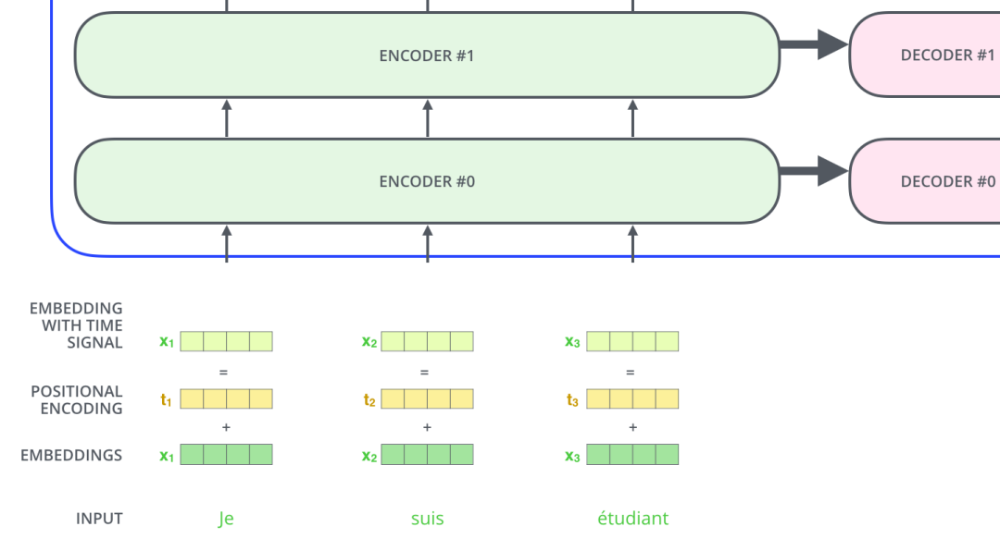

为了让模型了解单词的顺序，我们添加了带有位置编码的向量--这些向量的值遵循特定的模式。 如果我们假设词向量的维度是 4，那么带有位置编码的向量可能如下所示：

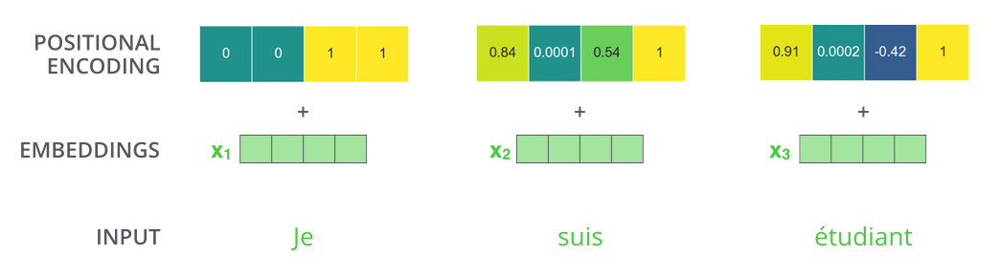

## 2.2.7 残差相连

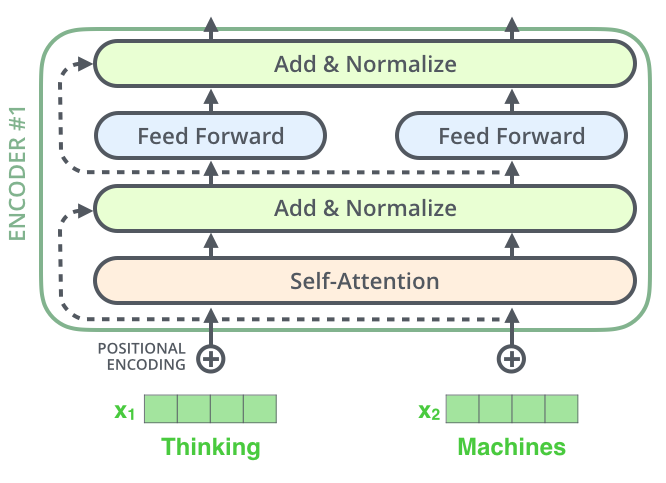

编码器结构中有一个需要注意的细节是：编码器的每个子层（Self Attention 层和 FFNN）都有一个残差连接和层标准化（layer-normalization）。

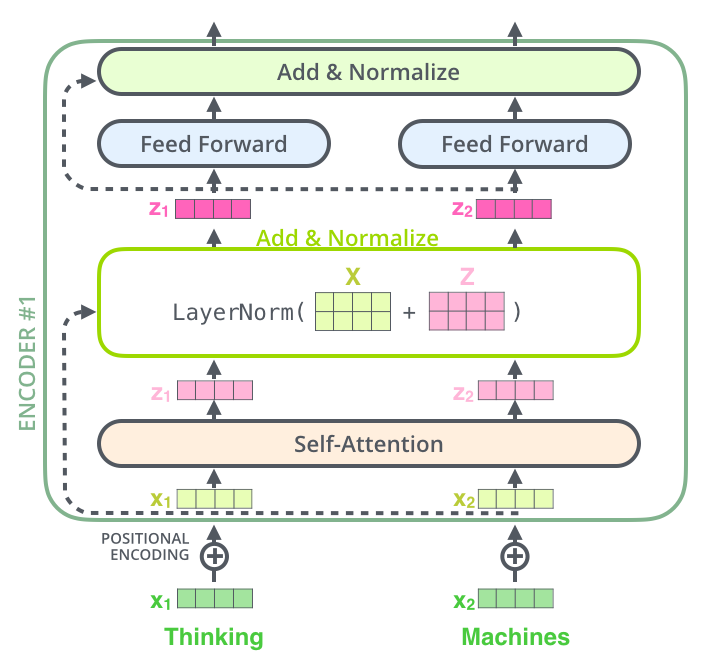

而在解码器的子层里面也有层标准化（layer-normalization）。假设一个 Transformer 是由 2 层编码器和两层解码器组成的，如下图所示：
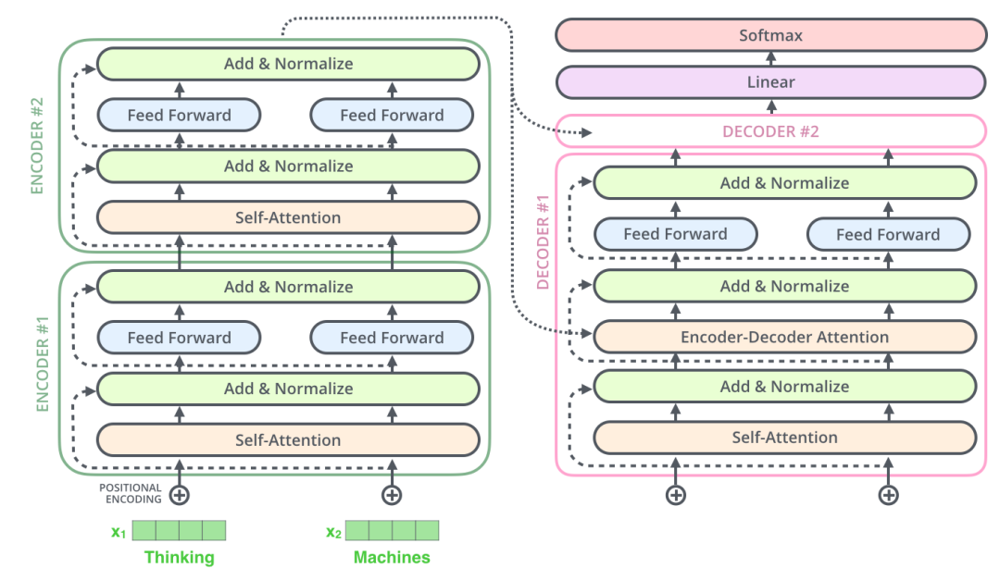

## 2.2.8 Decoder

编码器一般有多层，第一个编码器的输入是一个序列，最后一个编码器输出是一组注意力向量 K 和 V。这些注意力向量将会输入到每个解码器的Encoder-Decoder Attention层，这有助于解码器把注意力集中中输入序列的合适位置。

在完成了编码（encoding）阶段之后，我们开始解码（decoding）阶段。解码（decoding ）阶段的每一个时间步都输出一个翻译后的单词（这里的例子是英语翻译）。

接下来会重复这个过程，直到输出一个结束符，Transformer 就完成了所有的输出。每一步的输出都会在下一个时间步输入到下面的第一个解码器。Decoder 就像 Encoder 那样，从下往上一层一层地输出结果。正对如编码器的输入所做的处理，我们把解码器的输入向量，也加上位置编码向量，来指示每个词的位置。

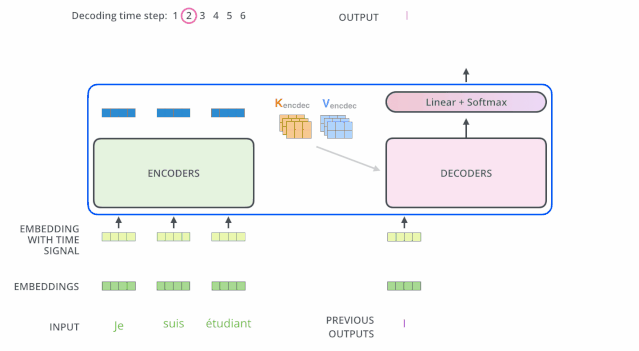

解码器中的 Self Attention 层，和编码器中的 Self Attention 层不太一样：在解码器里，Self Attention 层只允许关注到输出序列中早于当前位置之前的单词。具体做法是：在 Self Attention 分数经过 Softmax 层之前，屏蔽当前位置之后的那些位置。

Encoder-Decoder Attention层的原理和多头注意力（multiheaded Self Attention）机制类似，不同之处是：Encoder-Decoder Attention层是使用前一层的输出来构造 Query 矩阵，而 Key 矩阵和 Value 矩阵来自于编码器最终的输出。

## 2.2.9 线性层和Softmax层

Decoder 最终的输出是一个向量，其中每个元素是浮点数。我们怎么把这个向量转换为单词呢？这是由 Softmax 层后面的线性层来完成的。

线性层就是一个普通的全连接神经网络，可以把解码器输出的向量，映射到一个更长的向量，这个向量称为 logits 向量。

现在假设我们的模型有 10000 个英语单词（模型的输出词汇表），这些单词是从训练集中学到的。因此 logits 向量有 10000 个数字，每个数表示一个单词的分数。我们就是这样去理解线性层的输出。

然后，Softmax 层会把这些分数转换为概率（把所有的分数转换为正数，并且加起来等于 1）。然后选择最高概率的那个数字对应的词，就是这个时间步的输出单词。

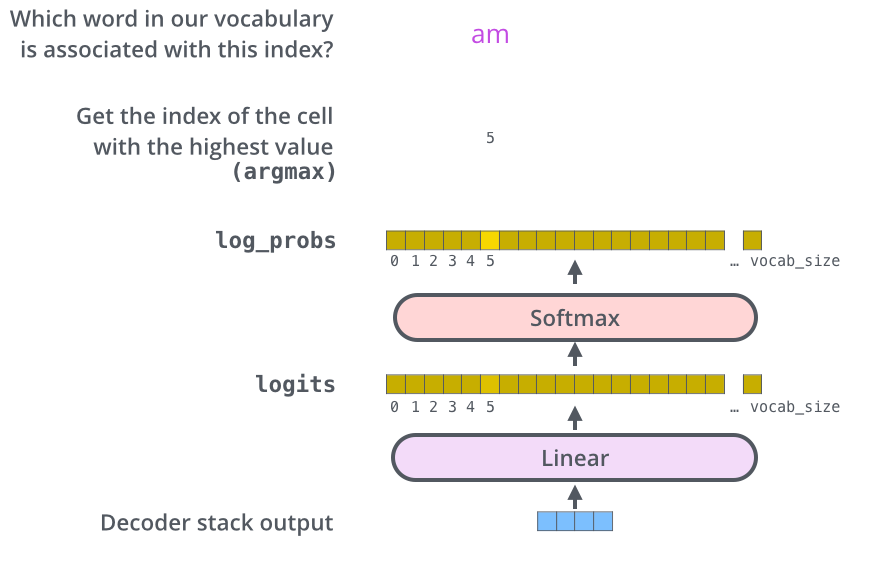

## 2.2.10 损失函数

由于模型的参数都是随机初始化的。模型在每个词输出的概率都是随机的。我们可以把这个概率和正确的输出概率做对比，然后使用反向传播来调整模型的权重，使得输出的概率分布更加接近震数输出。

我们可以简单地用一个概率分布减去另一个概率分布。关于更多细节，你可以查看**交叉熵(cross-entropy)]** 和 **KL 散度(Kullback–Leibler divergence)**的相关概念。

现在，由于模型每个时间步只产生一个输出，我们可以认为：模型是从概率分布中选择概率最大的词，并且丢弃其他词。这种方法叫做**贪婪解码（greedy decoding）**。

另一种方法是每个时间步保留两个最高概率的输出词，然后在下一个时间步，重复执行这个过程：假设第一个位置概率最高的两个输出的词是”I“和”a“，这两个词都保留，然后根据第一个词计算第二个位置的词的概率分布，再取出 2 个概率最高的词，对于第二个位置和第三个位置，我们也重复这个过程。这种方法称为**集束搜索(beam search)**，在我们的例子中，beam_size 的值是 2（含义是：在所有时间步，我们保留两个最高概率），top_beams 的值也是 2（表示我们最终会返回两个翻译的结果）。beam_size 和 top_beams 都是你可以在实验中尝试的超参数。